### <i> Cyber Attacks Detection With Advanced Machine Learning Algorithms </i>
### <i> Import Library Files </i>

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
import warnings

# Ignore all warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("Cyberattacks Detection.csv")

In [3]:
df

,Attack ID,Source IP,Destination IP,Source Country,Destination Country,Protocol,Source Port,Destination Port,Attack Type,Payload Size (bytes),Detection Label,Confidence Score,ML Model,Affected System,Port Type,Timestamp
0,1.0,68.156.227.194,194.91.121.112,India,USA,ICMP,16824.0,53410.0,Brute Force,3936.0,Detected,0.600507,K-Nearest Neighbors,Cloud Storage,Other,NaN
1,2.0,249.221.229.41,3.207.120.235,Germany,USA,TCP,23977.0,31745.0,Advanced Persistent Threat (APT),2870.0,Detected,0.524150,K-Nearest Neighbors,Network Router,Other,NaN
2,4.0,154.55.209.171,132.115.33.82,USA,China,UDP,36556.0,38880.0,Cross-Site Scripting (XSS) Attack,3833.0,Not Detected,0.238944,Neural Network,Workstation,Other,NaN
3,5.0,106.61.204.27,40.61.49.130,France,France,UDP,14724.0,21669.0,Insider Threat,4301.0,Not Detected,0.122334,Neural Network,Workstation,Other,NaN
4,6.0,144.190.250.125,34.68.66.192,South Korea,Germany,TCP,44693.0,6474.0,Watering Hole Attack,4569.0,Detected,0.970895,Neural Network,Application Server,Other,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996.0,249.190.160.222,92.174.237.234,China,UK,ICMP,16359.0,53207.0,Cross-Site Scripting (XSS) Attack,2152.0,Detected,0.765800,Support Vector Machine,Email Server,Other,6/16/2024 10:34
99996,99997.0,86.76.247.65,49.174.181.21,India,USA,ICMP,21591.0,44627.0,Simple Network Management Protocol (SNMP) Attack,598.0,Detected,0.864282,K-Nearest Neighbors,Cloud Storage,Other,6/10/2024 3:51
99997,99998.0,3.150.34.188,39.26.219.220,USA,Brazil,ICMP,5895.0,26251.0,Brute Force,1570.0,Detected,0.723099,K-Nearest Neighbors,Web Server,Other,7/8/2024 19:54
99998,99999.0,144.151.163.243,215.162.102.106,South Korea,China,ICMP,45336.0,46630.0,Drive-by Download,2987.0,Detected,0.564727,Random Forest,Network Router,Other,11/11/2024 20:14


### <i> Dataset Overview </i>

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Attack ID             99940 non-null  float64
 1   Source IP             99950 non-null  object 
 2   Destination IP        99945 non-null  object 
 3   Source Country        99950 non-null  object 
 4   Destination Country   99947 non-null  object 
 5   Protocol              99941 non-null  object 
 6   Source Port           99949 non-null  float64
 7   Destination Port      99946 non-null  float64
 8   Attack Type           99941 non-null  object 
 9   Payload Size (bytes)  99947 non-null  float64
 10  Detection Label       99933 non-null  object 
 11  Confidence Score      99946 non-null  float64
 12  ML Model              99939 non-null  object 
 13  Affected System       99954 non-null  object 
 14  Port Type             99939 non-null  object 
 15  Timestamp         

In [5]:
df.describe()

,Attack ID,Source Port,Destination Port,Payload Size (bytes),Confidence Score
count,99940.000000,99949.000000,99946.000000,99947.00000,99946.000000
mean,54435.925856,32774.963661,32659.780371,2501.75549,0.498099
std,30550.934530,18962.083103,18910.845867,1443.22658,0.290283
min,1.000000,1.000000,1.000000,1.00000,0.000030
25%,27700.750000,16338.000000,16273.250000,1252.00000,0.245179
50%,55457.500000,32694.000000,32625.000000,2501.00000,0.501513
75%,83196.250000,49272.000000,49018.750000,3753.00000,0.750472
max,100000.000000,65534.000000,65534.000000,4999.00000,1.000000


### <i> Checking And Removing Missing Values </i>

In [6]:
# Check for missing and null values
print("Missing values in each column:\n", df.isnull().sum())
print("\nPercentage of missing values:\n", (df.isnull().sum() / len(df)) * 100)


Missing values in each column:
 Attack ID                  60
Source IP                  50
Destination IP             55
Source Country             50
Destination Country        53
Protocol                   59
Source Port                51
Destination Port           54
Attack Type                59
Payload Size (bytes)       53
Detection Label            67
Confidence Score           54
ML Model                   61
Affected System            46
Port Type                  61
Timestamp               90174
dtype: int64

Percentage of missing values:
 Attack ID                0.060
Source IP                0.050
Destination IP           0.055
Source Country           0.050
Destination Country      0.053
Protocol                 0.059
Source Port              0.051
Destination Port         0.054
Attack Type              0.059
Payload Size (bytes)     0.053
Detection Label          0.067
Confidence Score         0.054
ML Model                 0.061
Affected System          0.046
Port Type

In [7]:
# Drop the 'Timestamp' column since it has too many missing values
df.drop('Timestamp', axis=1, inplace=True)

# Handling Missing Values for Numerical Columns
df['Attack ID'].fillna(df['Attack ID'].mean(), inplace=True)
df['Source Port'].fillna(df['Source Port'].mean(), inplace=True)
df['Destination Port'].fillna(df['Destination Port'].mean(), inplace=True)
df['Payload Size (bytes)'].fillna(df['Payload Size (bytes)'].mean(), inplace=True)
df['Confidence Score'].fillna(df['Confidence Score'].mean(), inplace=True)


In [8]:
# Handling Missing Values for Categorical Columns
# Filling missing categorical values with the most frequent value (mode) or a placeholder 'Unknown'
df['Source IP'].fillna('Unknown', inplace=True)
df['Destination IP'].fillna('Unknown', inplace=True)
df['Source Country'].fillna('Unknown', inplace=True)
df['Destination Country'].fillna('Unknown', inplace=True)
df['Protocol'].fillna('Unknown', inplace=True)
df['Attack Type'].fillna('Unknown', inplace=True)
df['Detection Label'].fillna('Unknown', inplace=True)
df['ML Model'].fillna('Unknown', inplace=True)
df['Affected System'].fillna('Unknown', inplace=True)
df['Port Type'].fillna('Unknown', inplace=True)

### <i> Expolatory Data Analysis  ( EDA )</i>

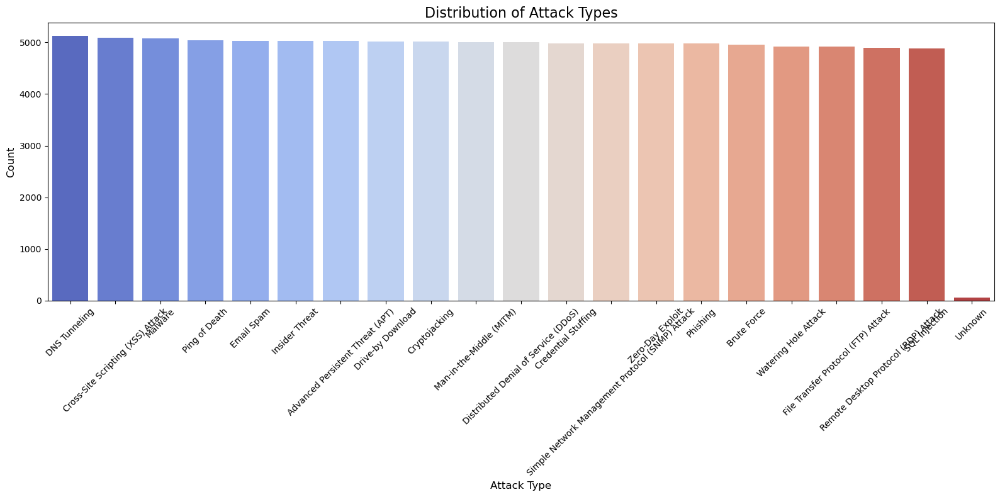

In [9]:
# Required Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# 2. Distribution of Attack Types
plt.figure(figsize=(16, 8))
attack_type_counts = df['Attack Type'].value_counts()
sns.barplot(x=attack_type_counts.index, y=attack_type_counts.values, palette='coolwarm')
plt.title('Distribution of Attack Types', fontsize=16)
plt.xlabel('Attack Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


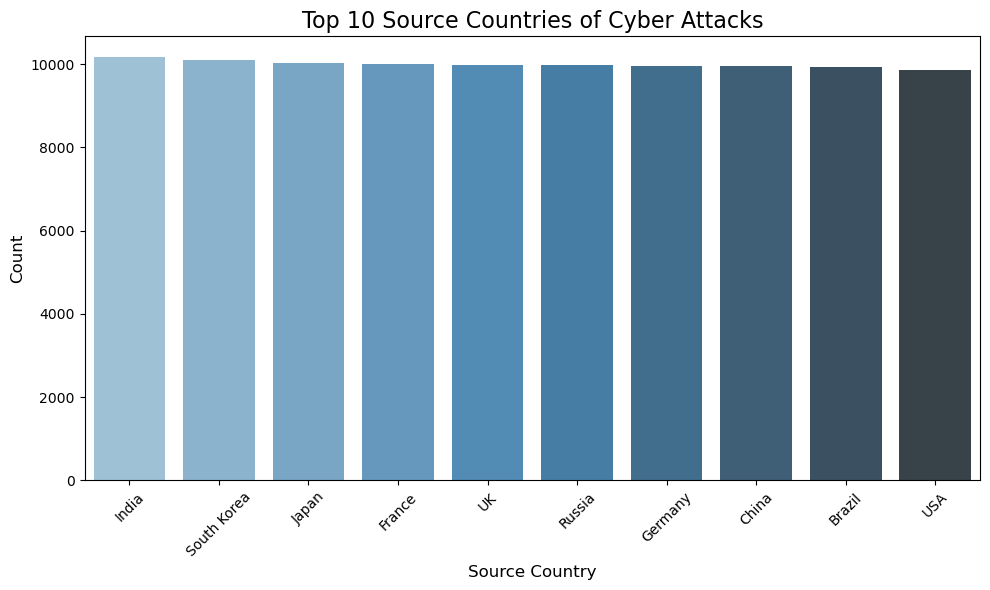

In [10]:
# 3. Top 10 Source Countries
plt.figure(figsize=(10, 6))
source_country_counts = df['Source Country'].value_counts().head(10)
sns.barplot(x=source_country_counts.index, y=source_country_counts.values, palette='Blues_d')
plt.title('Top 10 Source Countries of Cyber Attacks', fontsize=16)
plt.xlabel('Source Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

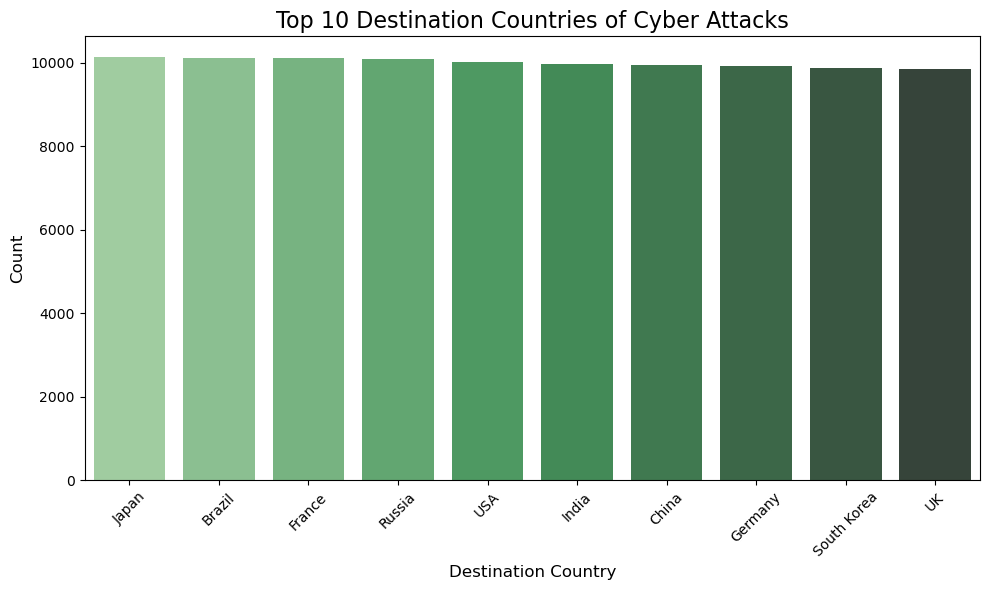

In [11]:
# 4. Top 10 Destination Countries
plt.figure(figsize=(10, 6))
destination_country_counts = df['Destination Country'].value_counts().head(10)
sns.barplot(x=destination_country_counts.index, y=destination_country_counts.values, palette='Greens_d')
plt.title('Top 10 Destination Countries of Cyber Attacks', fontsize=16)
plt.xlabel('Destination Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

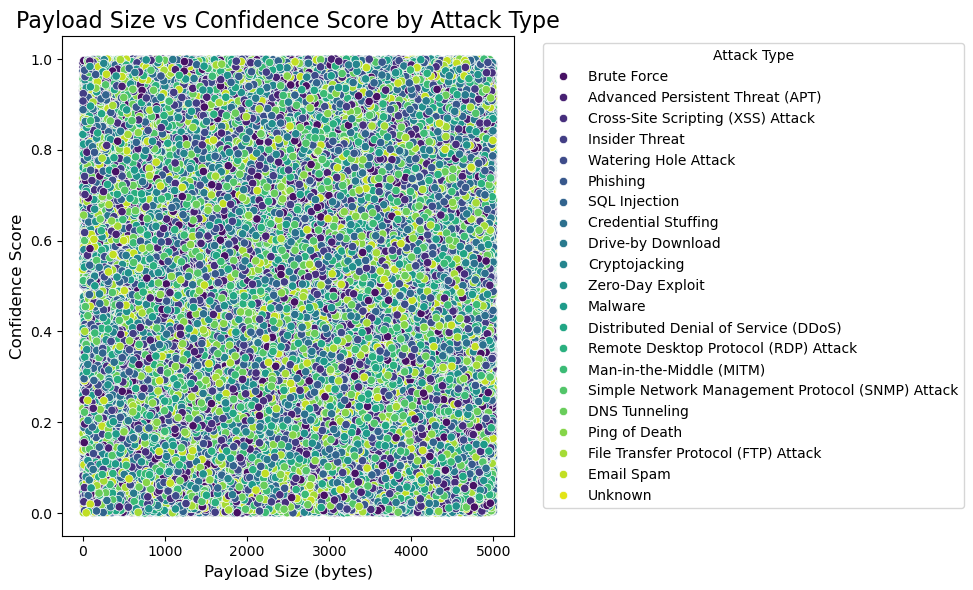

In [12]:
# 6. Scatter Plot of Payload Size vs Confidence Score
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Payload Size (bytes)', y='Confidence Score', hue='Attack Type', palette='viridis', data=df)
plt.title('Payload Size vs Confidence Score by Attack Type', fontsize=16)
plt.xlabel('Payload Size (bytes)', fontsize=12)
plt.ylabel('Confidence Score', fontsize=12)
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

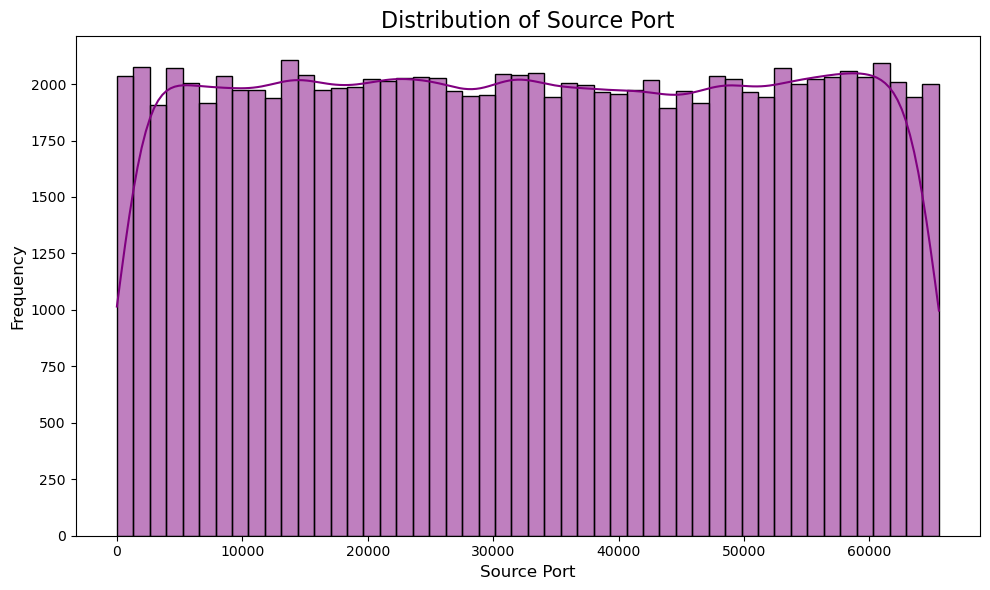

In [13]:
# 7. Source Port Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['Source Port'], bins=50, kde=True, color='purple')
plt.title('Distribution of Source Port', fontsize=16)
plt.xlabel('Source Port', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

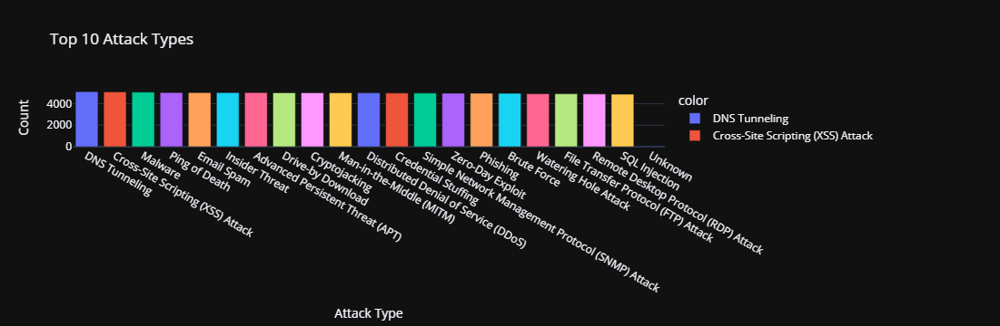

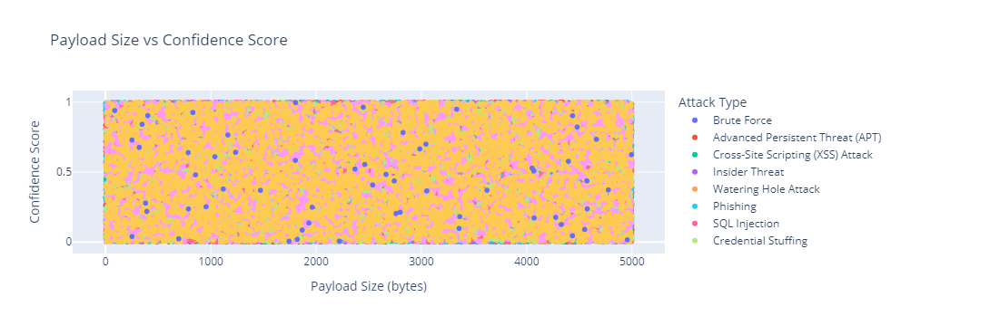

In [14]:
# 9. Interactive Plot: Top 10 Attack Types
fig = px.bar(attack_type_counts.head(10), x=attack_type_counts.index, y=attack_type_counts.values, 
             title="Top 10 Attack Types", labels={'x':'Attack Type', 'y':'Count'}, 
             color=attack_type_counts.index, template="plotly_dark")
fig.show()

# 10. Interactive Scatter Plot: Payload Size vs Confidence Score
fig = px.scatter(df, x="Payload Size (bytes)", y="Confidence Score", color="Attack Type",
                 title="Payload Size vs Confidence Score", 
                 labels={"Payload Size (bytes)": "Payload Size (bytes)", "Confidence Score": "Confidence Score"})
fig.show()

### <i> Label Encoding </i>

In [15]:
# After handling missing values, let's perform label encoding for categorical columns
label_encoder = LabelEncoder()

# List of categorical columns that need label encoding
categorical_columns = ['Source IP', 'Destination IP', 'Source Country', 'Destination Country', 
                       'Protocol', 'Attack Type', 'Detection Label', 'ML Model', 
                       'Affected System', 'Port Type']

# Applying Label Encoding to each categorical column
for col in categorical_columns:
    df[col] = label_encoder.fit_transform(df[col])

# Now the dataset is ready for modeling
print("\nData after preprocessing:\n", df.head())



Data after preprocessing:
    Attack ID  Source IP  Destination IP  Source Country  Destination Country  \
0        1.0      86308           41865               4                    9   
1        2.0      65352           70076               3                    9   
2        4.0      24730           14972               9                    1   
3        5.0       3862           74985               2                    2   
4        6.0      20281           72233               7                    3   

   Protocol  Source Port  Destination Port  Attack Type  Payload Size (bytes)  \
0         0      16824.0           53410.0            1                3936.0   
1         1      23977.0           31745.0            0                2870.0   
2         2      36556.0           38880.0            3                3833.0   
3         2      14724.0           21669.0           10                4301.0   
4         1      44693.0            6474.0           19                4569.0   

   D

In [16]:
df

,Attack ID,Source IP,Destination IP,Source Country,Destination Country,Protocol,Source Port,Destination Port,Attack Type,Payload Size (bytes),Detection Label,Confidence Score,ML Model,Affected System,Port Type
0,1.0,86308,41865,4,9,0,16824.0,53410.0,1,3936.0,0,0.600507,0,1,5
1,2.0,65352,70076,3,9,1,23977.0,31745.0,0,2870.0,0,0.524150,0,6,5
2,4.0,24730,14972,9,1,2,36556.0,38880.0,3,3833.0,1,0.238944,2,9,5
3,5.0,3862,74985,2,2,2,14724.0,21669.0,10,4301.0,1,0.122334,2,9,5
4,6.0,20281,72233,7,3,1,44693.0,6474.0,19,4569.0,0,0.970895,2,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996.0,65302,96954,1,8,0,16359.0,53207.0,3,2152.0,0,0.765800,4,3,5
99996,99997.0,94407,78273,4,9,0,21591.0,44627.0,17,598.0,0,0.864282,0,1,5
99997,99998.0,69876,74126,9,0,0,5895.0,26251.0,1,1570.0,0,0.723099,0,8,5
99998,99999.0,20208,50984,7,1,0,45336.0,46630.0,7,2987.0,0,0.564727,3,6,5


### <i> Modeling </i>
### <i> Logistic Regression </i>

In [17]:
# Required Libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Assuming df is already preprocessed and ready for modeling
# Splitting the dataset into features (X) and target (y)
X = df.drop('Detection Label', axis=1)  # Features (drop the target column)
y = df['Detection Label']  # Target

# Train-Test Split (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Logistic Regression Model
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_train, y_train)

# Predictions
y_pred = logistic_model.predict(X_test)

# Evaluation Metrics
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Logistic Regression Accuracy: 0.8139

Confusion Matrix:
 [[8308 1717    0]
 [1987 7970    0]
 [  13    5    0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.83      0.82     10025
           1       0.82      0.80      0.81      9957
           2       0.00      0.00      0.00        18

    accuracy                           0.81     20000
   macro avg       0.54      0.54      0.54     20000
weighted avg       0.81      0.81      0.81     20000



### <i> Random Forest </i>

In [18]:
# Required Libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Random Forest Model
random_forest_model = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest_model.fit(X_train, y_train)

# Predictions
y_pred_rf = random_forest_model.predict(X_test)

# Evaluation Metrics
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))


Random Forest Accuracy: 0.99895

Confusion Matrix:
 [[10025     0     0]
 [    3  9954     0]
 [    9     9     0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     10025
           1       1.00      1.00      1.00      9957
           2       0.00      0.00      0.00        18

    accuracy                           1.00     20000
   macro avg       0.67      0.67      0.67     20000
weighted avg       1.00      1.00      1.00     20000



### <i> XGboost </i>

In [19]:
# Required Libraries
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# XGBoost Model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluation Metrics
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))
print("\nClassification Report:\n", classification_report(y_test, y_pred_xgb))


XGBoost Accuracy: 0.999

Confusion Matrix:
 [[10024     1     0]
 [    1  9956     0]
 [    9     9     0]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     10025
           1       1.00      1.00      1.00      9957
           2       0.00      0.00      0.00        18

    accuracy                           1.00     20000
   macro avg       0.67      0.67      0.67     20000
weighted avg       1.00      1.00      1.00     20000

